In [2]:
import tensorflow as tf 

2025-05-06 06:29:49.983692: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746512990.195805      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746512990.258041      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [24]:
import pandas as pd
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import plot_model
import numpy as np
import codecs
from keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt
import plotly.express as px
from wordcloud import WordCloud
import seaborn as sns

%matplotlib inline

In [4]:
tf.__version__

'2.18.0'

In [5]:
import warnings
warnings.filterwarnings('ignore')

# Process Data

In [43]:
df = pd.DataFrame(columns=['en','fa'])
df

,en,fa


In [44]:
import codecs

# مسیر فایل‌ها
en_path = "/kaggle/input/en-fa-words/TEP.en-fa.en"
fa_path = "/kaggle/input/en-fa-words/TEP.en-fa.fa"

# تعداد خطوطی که می‌خوای بخونی: None = همه خطوط
max_lines = None  # یا مثلاً: max_lines = 100000 برای خواندن فقط 100 هزار خط

# خواندن فایل‌ها هم‌زمان و سریع
en_lines = []
fa_lines = []

with codecs.open(en_path, "r", "utf-8") as f_en, codecs.open(fa_path, "r", "utf-8") as f_fa:
    for i, (en_line, fa_line) in enumerate(zip(f_en, f_fa)):
        if max_lines is not None and i >= max_lines:
            break
        en_lines.append(en_line.strip())
        fa_lines.append(fa_line.strip())

# ساخت دیتافریم نهایی
df = pd.DataFrame({'en': en_lines, 'fa': fa_lines})

# نمایش ۵ سطر اول برای بررسی
df.head()

,en,fa
0,raspy breathing .,صداي خر خر .
1,dad .,پدر .
2,maybe its the wind .,شايد صداي باد باشه .
3,no .,نه .
4,stop please stop .,دست نگه داريد خواهش ميکنم دست نگه داريد .


In [8]:
df.shape

(612086, 2)

In [46]:
# حذف نقطه فقط از انتهای جملات
df['en'] = df['en'].str.rstrip('.')
df['fa'] = df['fa'].str.rstrip('.')
df

,en,fa
0,raspy breathing,صداي خر خر
1,dad,پدر
2,maybe its the wind,شايد صداي باد باشه
3,no,نه
4,stop please stop,دست نگه داريد خواهش ميکنم دست نگه داريد
...,...,...
612081,zodiac,دايره‌البروج
612082,zodiacal light,حمره مغربيه
612083,zombi,انسان زنده شد
612084,zombiism,مارخداگرائي


In [47]:
df['en_len'] = df['en'].str.split().apply(len)
df['fa_len'] = df['fa'].str.split().apply(len)

In [15]:
# ساخت دیتافریم برای رسم هیستوگرام مشترک
df_plot = pd.DataFrame({
    'Length': df['en_len'].tolist() + df['fa_len'].tolist(),
    'Language': ['English'] * len(df) + ['Farsi'] * len(df)
})

# رسم هیستوگرام تعاملی بدون فیلتر طول
fig = px.histogram(
    df_plot,
    x='Length',
    color='Language',
    nbins=60,
    barmode='overlay',
    marginal='box',
    opacity=0.6,
    template='plotly_dark',
    title='Interactive Histogram of Sentence Lengths (All Data)'
)

fig.update_layout(
    xaxis_title='Number of Words per Sentence',
    yaxis_title='Frequency',
    bargap=0.1
)

fig.show()

In [40]:
# درصد جملاتی که طولشون در هر زبان <= 30 هست
within_limit = df[(df['en_len'] <= 18) & (df['fa_len'] <= 18)]
percent_within_30 = (len(within_limit) / len(df)) * 100

print(f"✅ درصد جملات با طول <= 18 در هر دو زبان: {percent_within_30:.2f}%")

✅ درصد جملات با طول <= 18 در هر دو زبان: 99.35%


In [49]:
fig = px.scatter(
    df, x='en_len', y='fa_len',
    title="Sentence Length: English vs Farsi",
    labels={'en_len': 'English Sentence Length', 'fa_len': 'Farsi Sentence Length'},
    opacity=0.5,
    template='plotly_dark'
)
fig.show()

In [50]:
filtered_df = df[(df['en_len'] <= 18) & (df['fa_len'] <= 18)].copy()

print(f"📉 تعداد جملات بعد از فیلتر: {len(filtered_df):,}")
print(f"🗑 حذف شده‌ها: {len(df) - len(filtered_df):,} جمله با طول > 18 در حداقل یکی از زبان‌ها")

df = filtered_df

📉 تعداد جملات بعد از فیلتر: 608,090
🗑 حذف شده‌ها: 3,996 جمله با طول > 18 در حداقل یکی از زبان‌ها


In [51]:
df['length_ratio'] = df['fa_len'] / df['en_len']
fig = px.histogram(
    df, x='length_ratio',
    nbins=60,
    title="Ratio of Farsi to English Sentence Lengths",
    template='plotly_dark'
)
fig.update_layout(xaxis_title='Farsi Length / English Length', yaxis_title='Count')
fig.show()

In [57]:
too_short_fa = df[df['length_ratio'] < 0.25]
too_long_fa = df[df['length_ratio'] > 3]
in_safe_range = df[(df['length_ratio'] >= 0.5) & (df['length_ratio'] <= 2)]

print(f"🔻 جملات با ترجمه فارسی بسیار کوتاه (<0.25): {len(too_short_fa):,} جمله ({len(too_short_fa)/len(df)*100:.2f}%)")
print(f"🔺 جملات با ترجمه فارسی بسیار طولانی (>3): {len(too_long_fa):,} جمله ({len(too_long_fa)/len(df)*100:.2f}%)")
print(f"✅ جملات در بازه امن (0.5 - 2): {len(in_safe_range):,} جمله ({len(in_safe_range)/len(df)*100:.2f}%)")

🔻 جملات با ترجمه فارسی بسیار کوتاه (<0.25): 577 جمله (0.09%)
🔺 جملات با ترجمه فارسی بسیار طولانی (>3): 1,716 جمله (0.28%)
✅ جملات در بازه امن (0.5 - 2): 582,902 جمله (95.86%)


In [61]:
print("🔻 جملات با ترجمه فارسی خیلی کوتاه:")
display(too_short_fa[['en', 'fa', 'en_len', 'fa_len', 'length_ratio']].head(5))

print("\n🔺 جملات با ترجمه فارسی خیلی بلند:")
display(too_long_fa[['en', 'fa', 'en_len', 'fa_len', 'length_ratio']].head(5))

🔻 جملات با ترجمه فارسی خیلی کوتاه:


,en,fa,en_len,fa_len,length_ratio
1522,"hey , hey , hey , hey . over here . through here",از اين طرف,13,3,0.230769
1555,"a kingdom , your very life",پادشاهي,6,1,0.166667
1584,"you know , as things move forward",ميدوني,7,1,0.142857
1650,why i thought someone believed in me,چرا,7,1,0.142857
2027,youll never get that shot,عمرا,5,1,0.200000



🔺 جملات با ترجمه فارسی خیلی بلند:


,en,fa,en_len,fa_len,length_ratio
2154,their favorite,اين ، آهنگ مورد علاقه ي منه,2,7,3.5
2757,hand,مواظب باش پشت سرت,1,4,4.0
3117,,مال من بود,0,3,inf
3124,,افراد وظايف تون را انجام بديد,0,6,inf
3392,slayers,يه آدمكش ممكنه اينجا باشه,1,5,5.0


In [63]:
# تعریف بازه سالم برای نسبت طول
min_ratio = 0.5
max_ratio = 2.24

df = df[(df['length_ratio'] >= min_ratio) & (df['length_ratio'] <= max_ratio)]

print(f"✅ تعداد جملات باقی‌مانده پس از فیلتر: {len(df):,}")

✅ تعداد جملات باقی‌مانده پس از فیلتر: 583,486


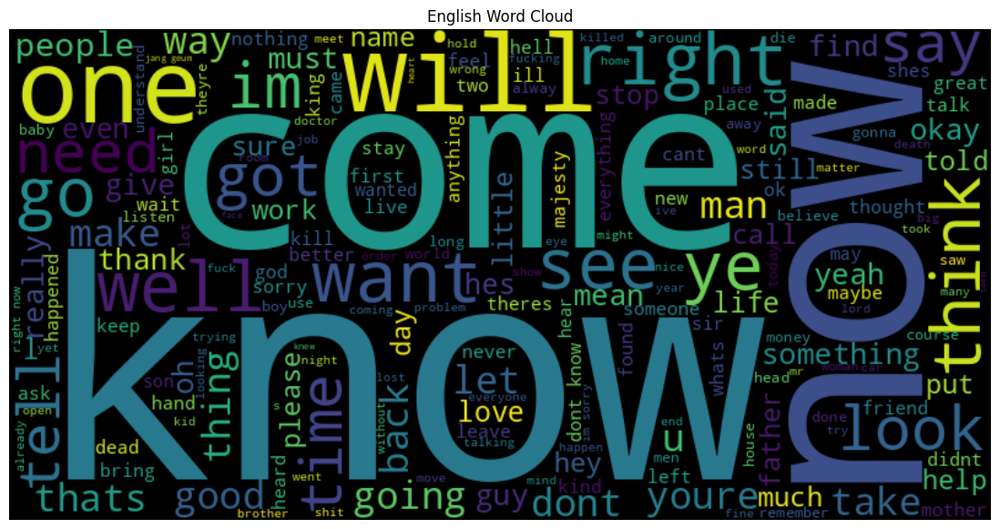

In [64]:
text = ' '.join(df['en'].tolist())
wordcloud = WordCloud(width=800, height=400, background_color='black').generate(text)
plt.figure(figsize=(15, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("English Word Cloud")
plt.show()

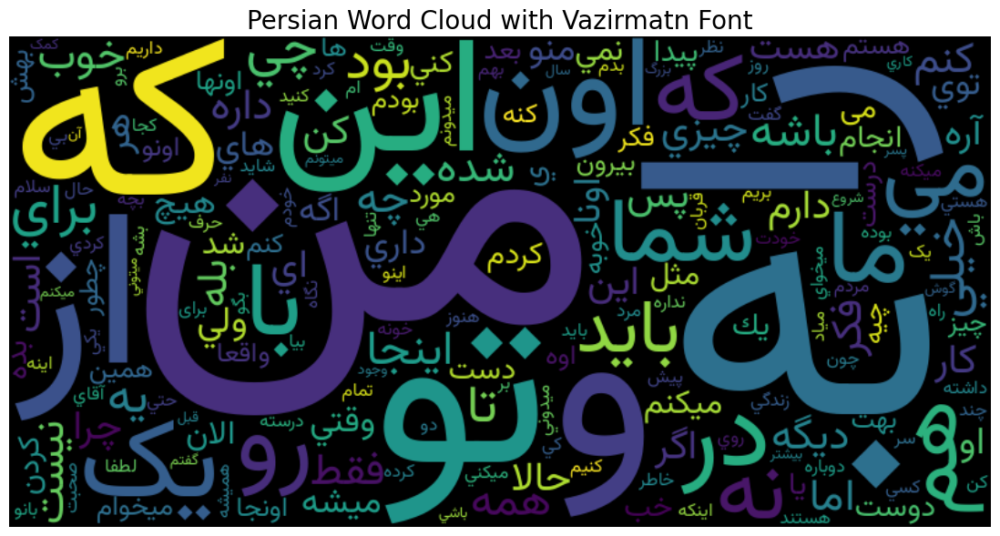

In [65]:
font_path = '/kaggle/input/persian-font/Vazirmatn-Regular.ttf'

text = ' '.join(df['fa'].tolist())

wordcloud = WordCloud(
    width=800,
    height=400,
    font_path=font_path,
    background_color='black',
    collocations=False
).generate(text)

plt.figure(figsize=(15, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Persian Word Cloud with Vazirmatn Font", fontsize=20)
plt.show()

In [66]:
duplicate_en = df['en'].value_counts()
duplicate_fa = df['fa'].value_counts()

repeated_en = duplicate_en[duplicate_en > 1]
repeated_fa = duplicate_fa[duplicate_fa > 1]

print("🔁 Top 10 Repeated English Sentences:")
print(repeated_en.head(10))

print("\n🔁 Top 10 Repeated Farsi Sentences:")
print(repeated_fa.head(10))

🔁 Top 10 Repeated English Sentences:
en
yes               1730
what?              764
what is it?        547
blank              401
no                 362
yes, sir           294
what happened?     282
yes!               278
your majesty       234
thank you          231
Name: count, dtype: int64

🔁 Top 10 Repeated Farsi Sentences:
fa
بله          1634
خالی          401
چي؟           367
چي شده؟       339
نه            284
بله قربان     236
سرورم         234
بسيار خوب     227
باشه          194
درسته         182
Name: count, dtype: int64


In [68]:
all_en_words = " ".join(df['en']).split()
all_fa_words = " ".join(df['fa']).split()

unique_en_words = set(all_en_words)
unique_fa_words = set(all_fa_words)

print("📉 Vocabulary Statistics:")
print(f"✅ Number of unique English words: {len(unique_en_words):,}")
print(f"✅ Number of unique Farsi words:   {len(unique_fa_words):,}")

📉 Vocabulary Statistics:
✅ Number of unique English words: 97,223
✅ Number of unique Farsi words:   144,137


In [69]:
heatmap_data = df.groupby(['fa_len', 'en_len']).size().reset_index(name='count')

fig = px.density_heatmap(
    heatmap_data,
    x='en_len',
    y='fa_len',
    z='count',
    nbinsx=50,
    nbinsy=50,
    color_continuous_scale='Viridis',
    labels={'en_len': 'English Sentence Length', 'fa_len': 'Farsi Sentence Length', 'count': 'Frequency'},
    title="🔥 Interactive Heatmap of Sentence Lengths (Farsi vs English)"
)

fig.update_layout(
    xaxis_title="English Sentence Length",
    yaxis_title="Farsi Sentence Length",
    template='plotly_dark'
)

fig.show()